# Исследование рынка заведений общественного питания Москвы

В данном исследовании необходимо подготовить данные для анализа рынка Москвы, найти особенности, которые в будущем помогут в выборе подходящего инвесторам места.
В ходе исследования будет анализироваться датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация носит исключительно справочный характер.

## Описание данных:
 - name — название заведения;
 - address — адрес заведения;
 - category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
 - hours — информация о днях и часах работы;
 - lat — широта географической точки, в которой находится заведение;
 - lng — долгота географической точки, в которой находится заведение;
 - rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
 - price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
 - avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   - «Средний счёт: 1000–1500 ₽»;
   - «Цена чашки капучино: 130–220 ₽»;
   - «Цена бокала пива: 400–600 ₽».
 - middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
 - middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
   - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
   - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
   - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
 - chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
   - 0 — заведение не является сетевым
   - 1 — заведение является сетевым
 - district — административный район, в котором находится заведение, например Центральный административный округ;
 - seats — количество посадочных мест.

## План работ:

<b>Предобработка данных:</b>
- Импорт данных;
- Обработка пропусков;
- Удаление дубликатов;
- Создание столбца street с названиями улиц из столбца с адресом;
- Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
   - логическое значение True — если заведение работает ежедневно и круглосуточно;
   - логическое значение False — в противоположном случае.
   
<b>Анализ данных</b>
 - Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализации.
 - Исследовать количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построение визуализации.
 - Рассмотреть соотношение сетевых и несетевых заведений в датасете.
 - Определить топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 
 - Отобразить общее количество заведений и количество заведений каждой категории по районам.
 - Визуализировать распределение средних рейтингов по категориям заведений.
 - Построение фоновой картограммы (хороплет) со средним рейтингом заведений каждого района.
 - Отобразить все заведения датасета на карте с помощью кластеров средствами библиотеки folium.
 - Определить топ-15 улиц по количеству заведений.
 - Построение фоновой картограммы (хороплет) с полученными значениями для каждого района.
 
<b>Дополнительный анализ данных</b>
 
<b>Детализация исследования по кофейням</b>

<b>Итоговые выводы</b>

<b>Презентация</b>

## Предобработка данных

### Импорт библиотек и данных

In [1]:
! pip install folium

In [2]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from plotly import graph_objects as go
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [3]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [4]:
try:
    data = pd.read_csv('moscow_places.csv')
except:
    data = pd.read_csv('moscow_places.csv')
    
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


### Подготовка данных

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [6]:
# Проверка на пропуски
display(data.isna().sum())
#Добавляем информирование по процентам пропусков с тепловым обозначением
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm')

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


<b>Вывод</b>

В данных имеются пропуски:

 - Пропуски заменить на что-то логичное нет возможности, удалять данные пропуске нельзя, так как будет потерян значимый процент данных.

In [7]:
display(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

In [8]:
# Проверка на явные дубликаты
display(data.duplicated().sum())

0

In [9]:
# Проверка на неявыне дубликаты
display(data['category'].nunique())
display(data['category'].unique().tolist())

8

['кафе',
 'ресторан',
 'кофейня',
 'пиццерия',
 'бар,паб',
 'быстрое питание',
 'булочная',
 'столовая']

In [10]:
display(data['name'].nunique())

5614

In [11]:
# Перевод в верхний регистр 
data['name'] = data['name'].str.upper()
# Удаление пробелов по краям
data['name'] = data['name'].str.strip()

In [12]:
data['name'] = data['name'].str.replace('Ё','Е')

In [13]:
display(data['name'].nunique())

5506

<b>Вывод</b>

После проверки явных и неявных дубликатов уменьшили кол-во уникальных названий заведений с 5614 до 5506 (т.е. удалили неявные дубли, которые могли бы внести корректировки в финальные результаты). Для итогового анализа нам не важно в каком регистре названия.


In [14]:
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,СУШИ МАНИЯ,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,МИСЛАВНЕС,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,САМОВАР,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,ЧАЙХАНА SABR,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


### Добавление столбцов

In [15]:
# Создание столбца street с названиями улиц из столбца с адресом;

data['street'] = data['address'].apply(
    lambda x: x.split(',')[1].strip()
)

In [16]:
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,СУШИ МАНИЯ,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица
8402,МИСЛАВНЕС,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект
8403,САМОВАР,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица
8404,ЧАЙХАНА SABR,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица


In [17]:
# Создание столбца is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].apply(
    lambda x: True if x == 'ежедневно, круглосуточно' 
    else False
)

In [18]:
display(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WOWФЛИ,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,ЧЕТЫРЕ КОМНАТЫ,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,ХАЗРИ,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,СУШИ МАНИЯ,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8402,МИСЛАВНЕС,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,Пролетарский проспект,False
8403,САМОВАР,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True
8404,ЧАЙХАНА SABR,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,Люблинская улица,True


<b>Вывод</b>

Предобработка выполнена, столбцы добавлены

## Анализ данных

### Анализ кол-ва заведений по категориям

In [19]:
data_cat = (data.groupby('category').agg(count=('lat','count')).reset_index().sort_values('count', ascending=False))
display(data_cat)

,category,count
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [20]:
fig = px.bar(data_cat, x='category', y='count',text='count')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Заведения по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Кол-во заведений')
fig.show() 

<b>Вывод</b>

Наиболее популярные категории заведений в Москве - Кафе (2003) и Рестораны (1969), меньше всего - Столовая(306) и Булочная (249)

### Анализ кол-ва посадочных мест по категориям

In [21]:
data.groupby('category')['seats'].median().sort_values(ascending=False)

category
ресторан           86.0
бар,паб            82.5
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

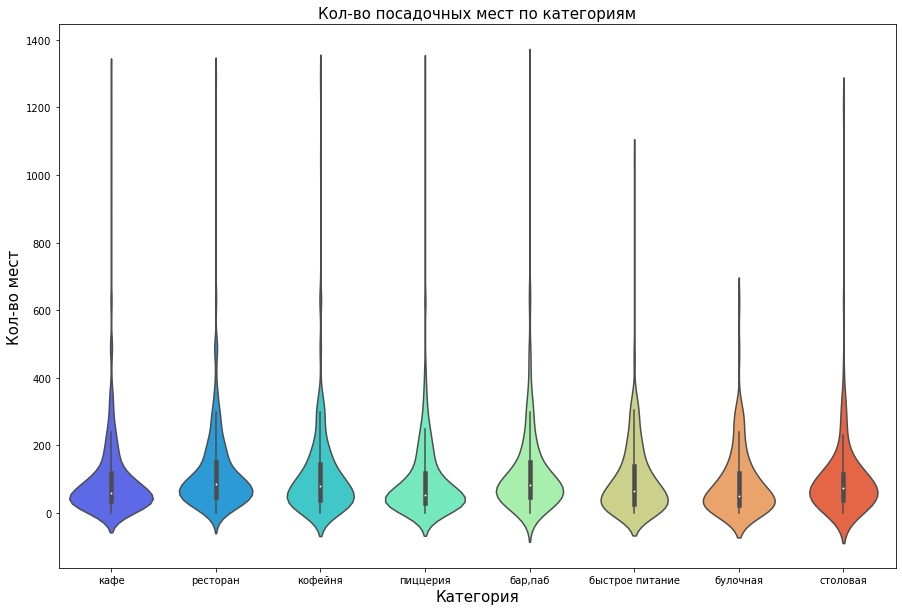

In [22]:
plt.figure(figsize=(15, 10))
fig = sns.violinplot(x='category', y='seats', data=data, palette='rainbow') 
fig.set_ylabel('Кол-во мест', fontsize=15)
fig.set_xlabel('Категория', fontsize=15)
fig.set_title('Кол-во посадочных мест по категориям', fontsize=15);

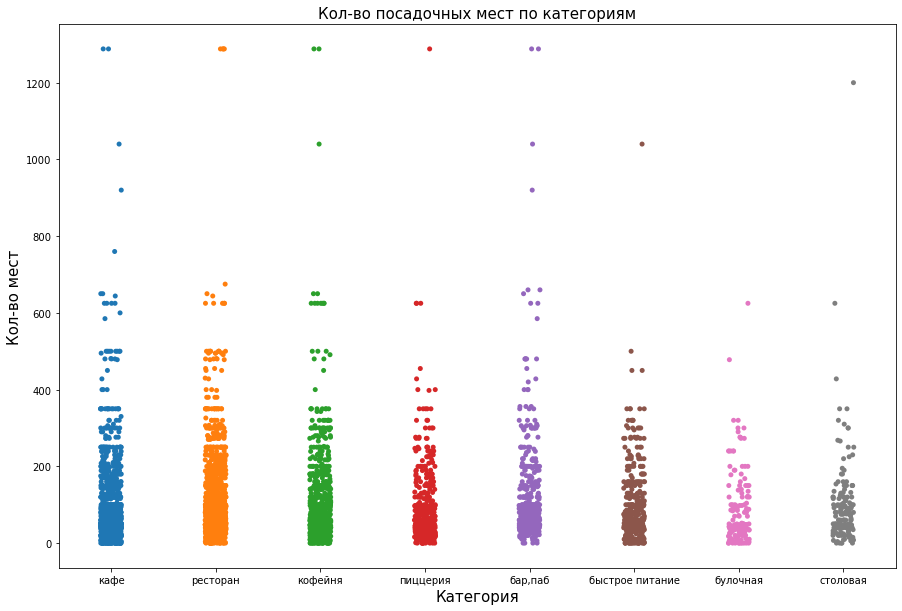

In [23]:
plt.figure(figsize=(15, 10))
fig = sns.stripplot(x='category', y='seats', data=data) 
fig.set_ylabel('Кол-во мест', fontsize=15)
fig.set_xlabel('Категория', fontsize=15)
fig.set_title('Кол-во посадочных мест по категориям', fontsize=15);

In [24]:
seats_med = data.groupby('category').agg(median=('seats','median')).reset_index().sort_values('median', ascending=False)

In [25]:
fig = px.bar(seats_med, x='category', y='median',text='median')
fig.update_xaxes(tickangle=45)
fig.update_yaxes(range=[40, 90])
fig.update_layout(title='Заведения по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Кол-во заведений'
                   )
fig.show() 

<b>Вывод</b>

Наибольшее медианное значение у категории ресторан - 86 (выглядит логично в ресторане - стоять такая себе история), а вот наименьший показатель у категории булочная - 50 (логично тут много работает на вынос или просто перекусить часто можно и стоя)

### Соотношение сетевых и несетевых заведений

In [26]:
# Посчитаем кол-во по группам и подготовим к визуализации
data_chain = (data.groupby('chain').agg(count=('lat','count')).reset_index())
data_chain['chain'] = data_chain['chain'].map({1: 'Сетевое', 0: 'Несетевое'})
display(data_chain)

,chain,count
0,Несетевое,5201
1,Сетевое,3205


In [27]:
fig = go.Figure(data=[go.Pie(values=data_chain['count'], labels=data_chain['chain'], pull = [0.1, 0])])
fig.update_layout(title='Соотношение сетевых и несетевых заведений',
                   uniformtext_mode='hide')
fig.show()

<b>Вывод</b>

В анализируемых данных больше всего несетевых заведений - 5201 или 61.9%

### Исследование сетевых заведений

In [28]:
# Создадим данныне только по сетевым заведениям
chain_rest = data.query('chain == 1')
display(chain_rest)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
4,ИЛЬ МАРКО,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
13,БУХАНКА,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False
19,ПЕКАРНЯ,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.887969,37.515688,4.4,NaN,NaN,NaN,NaN,1,NaN,Ижорский проезд,True
20,ЧЕБУРЕКИ МАНТЫ,кафе,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.880287,37.448646,4.3,NaN,NaN,NaN,NaN,1,148.0,Правобережная улица,False
23,БУХАНКА,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8317,БЕСЕДКА,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8340,СЕМЕЙНЫЙ ОЧАГ,ресторан,"Москва, Шоссейная улица, 13",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.688104,37.725197,4.3,средние,Средний счёт:до 1000 ₽,1000.0,NaN,1,98.0,Шоссейная улица,False
8372,ЧАЙХАНА SABR,ресторан,"Москва, улица Хлобыстова, 22",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.716361,37.813436,3.9,средние,Средний счёт:150–350 ₽,250.0,NaN,1,32.0,улица Хлобыстова,False
8379,ЛАГМАН ХАУС,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [29]:
chain_rest_cat = (chain_rest.groupby('category').agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(chain_rest_cat)

,category,count
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


In [30]:
fig = px.bar(chain_rest_cat, x='category', y='count',text='count')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Сетевые заведения по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Кол-во заведений')
fig.show() 

In [31]:
chain_rest_all = chain_rest_cat.merge(data_cat, how='inner', on='category')
chain_rest_all.columns = [ 'category', 'count_chain', 'count_all']
chain_rest_all['ratio'] = (chain_rest_all['count_chain']/chain_rest_all['count_all'] * 100).round(2)
chain_rest_all = chain_rest_all.sort_values('ratio', ascending=False)
display(chain_rest_all)

,category,count_chain,count_all,ratio
6,булочная,157,256,61.33
3,пиццерия,330,633,52.13
2,кофейня,720,1413,50.96
4,быстрое питание,232,603,38.47
1,ресторан,730,2043,35.73
0,кафе,779,2378,32.76
7,столовая,88,315,27.94
5,"бар,паб",169,765,22.09


In [32]:
fig = px.bar(chain_rest_all, x='category', y='ratio',text='ratio')
fig.update_xaxes(tickangle=45)

fig.update_layout(title='Процент сетевых заведений по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Процент сетевых заведений'
                   )
fig.show() 

<b>Вывод</b>

Наибольшее кол-во сетевых заведений относится к категориям: кофейня, ресторан, кафе (логично, так как на рынке много франшиз в этих категориях), самый же низкий показатель у столовых (сеть столовых - это интересно)
Булочные пиццерии и кофейни чаще всего являются сетевыми (более 50% заведений - сетевые)

### Топ-15 популярных сетей в Москве

In [33]:
rest_top = chain_rest.groupby('name').agg(count=('lat','count')).reset_index().sort_values('count', ascending=False).head(15)
display(rest_top)

,name,count
730,ШОКОЛАДНИЦА,120
335,ДОМИНО'С ПИЦЦА,76
331,ДОДО ПИЦЦА,74
146,ONE PRICE COFFEE,71
743,ЯНДЕКС ЛАВКА,69
58,COFIX,65
168,PRIME,50
665,ХИНКАЛЬНАЯ,44
411,КОФЕПОРТ,42
420,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,39


In [34]:
# Составим датасет по топ 15 сетевым заведениям
rest_top_data = data.merge(rest_top, how='inner', on='name')
display(rest_top_data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,count
0,БУХАНКА,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,1,180.0,Базовская улица,False,32
1,БУХАНКА,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,1,NaN,Лобненская улица,False,32
2,БУХАНКА,булочная,"Москва, Юрловский проезд, 14, корп. 3",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.879131,37.613068,4.3,NaN,NaN,NaN,NaN,1,NaN,Юрловский проезд,False,32
3,БУХАНКА,булочная,"Москва, проезд Шокальского, 33",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.882732,37.648054,4.2,средние,Средний счёт:200–350 ₽,275.0,NaN,1,NaN,проезд Шокальского,False,32
4,БУХАНКА,булочная,"Москва, Полярная улица, 27, корп. 2",Северо-Восточный административный округ,"ежедневно, 07:00–23:00",55.882158,37.636682,4.2,NaN,NaN,NaN,NaN,1,52.0,Полярная улица,False,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
813,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,"Москва, улица Коровий Вал, 1А, стр. 1",Центральный административный округ,"ежедневно, 08:00–23:00",55.729343,37.621895,4.3,средние,Средний счёт:300–500 ₽,400.0,NaN,1,250.0,улица Коровий Вал,False,39
814,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,"Москва, Мичуринский проспект, вл27",Западный административный округ,"ежедневно, 08:00–23:00",55.697745,37.500395,4.4,средние,Средний счёт:500 ₽,500.0,NaN,1,NaN,Мичуринский проспект,False,39
815,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,"Москва, улица 10-летия Октября, 9",Центральный административный округ,"ежедневно, 08:00–23:00",55.725386,37.563071,4.4,средние,Средний счёт:450–500 ₽,475.0,NaN,1,8.0,улица 10-летия Октября,False,39
816,КУЛИНАРНАЯ ЛАВКА БРАТЬЕВ КАРАВАЕВЫХ,кафе,"Москва, улица Кржижановского, 22, стр. 1",Юго-Западный административный округ,"ежедневно, 08:00–23:00",55.677807,37.574186,4.4,NaN,NaN,NaN,NaN,1,100.0,улица Кржижановского,False,39


In [35]:
rest_top_cat = (rest_top_data.groupby('category').agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(rest_top_cat)

,category,count
4,кофейня,337
6,ресторан,186
5,пиццерия,152
3,кафе,100
1,булочная,25
2,быстрое питание,12
0,"бар,паб",4
7,столовая,2


In [36]:
fig = px.bar(rest_top_cat, x='category', y='count',text='count')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Топ 15 сетевых заведения по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Кол-во заведений')
fig.show() 

In [37]:
fig = px.bar(rest_top, x='name', y='count',text='count')
fig.update_xaxes(tickangle=45)
fig.update_layout(title='Топ 15 сетевых заведения по сетям',
                   xaxis_title='Сеть',
                   yaxis_title='Кол-во заведений')
fig.show() 

<b>Вывод</b>

Большая часть сетевых заведений относится к категории "Кофейня" и самая популярная сеть в данной категории - Шоколадница
Самая малочисленная категория в сетевых - это столовая и бар,паб, что логично

### Анализ по административным районам

In [38]:
print(data['district'].nunique())
print(data['district'].unique())

9
['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [39]:
data_dist = (data.groupby(['district','category']).agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(data_dist)

,district,category,count
46,Центральный административный округ,ресторан,670
43,Центральный административный округ,кафе,464
44,Центральный административный округ,кофейня,428
40,Центральный административный округ,"бар,паб",364
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [40]:
fig = px.sunburst(data_dist, path=['district', 'category'], values='count')
fig.update_layout(title='Заведения по округам')

fig.show()

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Неинформативно, но оставим для себя

In [41]:
fig = px.bar(data_dist, x='district', y='count', color='category', text=data_dist['count'])
fig.update_xaxes(tickangle=45)
fig.update_layout( title='Категории заведений по округам',
                   xaxis={'categoryorder':'total descending'},
                   xaxis_title='Округ',
                   yaxis_title='Кол-во заведений',
                   width=1000, # указываем размеры графика
                   height=900,)

fig.show() 

<b>Вывод</b>

Наибольшее количество заведений находится в Центральнов округе (больше всего там ресторанов - свойственно для более дорогого района и центра города, куда приезжают погулять). Меньше всего заведений в Северо-Западном округе.
Интересное наблюдение что рестораны самая популярная категория только в центре и на Северо-Западе, в остальных округах наиболее популярны кафе.

### Анализ по средним рейтингам

In [42]:
rating_mean = data.groupby('category', as_index=False)['rating'].mean().round(2).sort_values(by='rating', ascending=False)
rating_mean.columns = ['category', 'rating_mean']
rating_mean

,category,rating_mean
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [43]:
fig = px.bar(rating_mean, x='category', y= 'rating_mean',text='rating_mean')
fig.update_xaxes(tickangle=45)
fig.update_yaxes(range=[4, 4.5])
fig.update_layout(title='Рейтинг оценок по категориям',
                   xaxis_title='Категория',
                   yaxis_title='Средняя оценка')
fig.show()

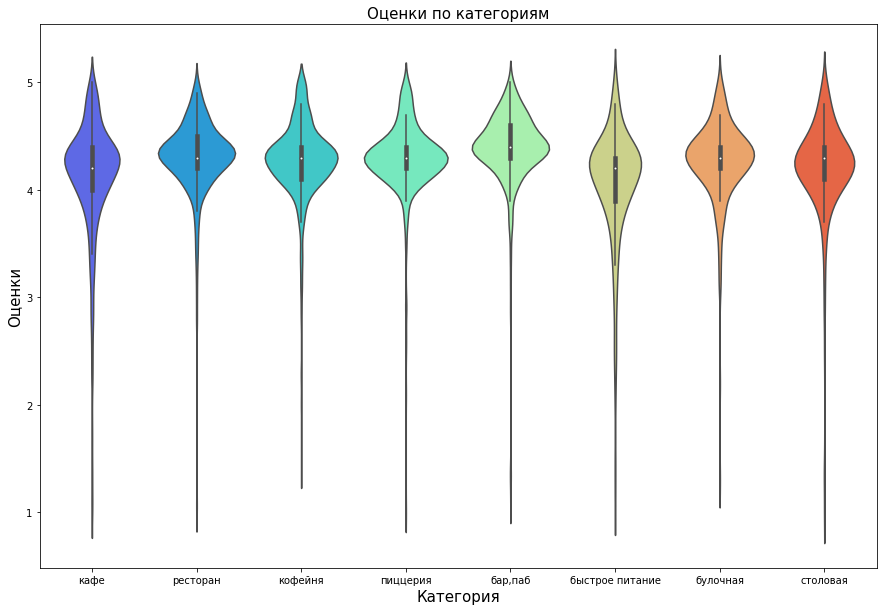

In [44]:
plt.figure(figsize=(15, 10))
fig = sns.violinplot(x='category', y='rating', data=data, palette='rainbow') 
fig.set_ylabel('Оценки', fontsize=15)
fig.set_xlabel('Категория', fontsize=15)
fig.set_title('Оценки по категориям', fontsize=15);

<b>Вывод</b>

Средняя оценка по всем категориям превышает 4, что выглядит довольно неплохо, но имеются выбросы. Усреднение - это хорошо но если смотреть по района то картина может быть разнообразна.

### Карта по районам и рейтенгам заведений в них

In [45]:
distr_rating_mean = data.groupby('district', as_index=False)['rating'].mean().round(2).sort_values(by='rating', ascending=False)
distr_rating_mean.columns = ['district', 'rating_mean']
distr_rating_mean

,district,rating_mean
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [46]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distr_rating_mean,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<b>Вывод</b>

Самый высокий средний рейтинг заведений в центральном округе - ожидаемо. Самый низкий рейтинг в Юго-Восточном округе (там и заведений меньше чем в центральном и ресторанов, которые собирают высокие рейтинги тоже меньше).

### Все анализируемые заведения

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Топ улиц по кол-ву заведений

In [48]:
street_top = data.groupby('street').agg(count=('name','count')).reset_index().sort_values('count', ascending=False).head(15)
display(street_top)

,street,count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [49]:
street_top_cat = data.groupby(['street','category']).agg(count=('name','count')).reset_index().sort_values('count', ascending=False)
display(street_top_cat)

,street,category,count
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


In [50]:
street_cat = street_top_cat.merge(street_top, how='inner', on='street')
street_cat.columns = ['street', 'category', 'count_cat', 'count_street']
street_cat = street_cat.sort_values('count_street', ascending=False)
display(street_cat)

,street,category,count_cat,count_street
0,проспект Мира,кафе,53,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
5,проспект Мира,пиццерия,11,184
...,...,...,...,...
91,Пятницкая улица,кафе,7,48
95,Пятницкая улица,быстрое питание,2,48
93,Пятницкая улица,булочная,3,48
92,Пятницкая улица,кофейня,6,48


In [51]:
street_cat['street'].nunique()

15

In [52]:
fig = px.sunburst(street_cat, path=['street', 'category'], values='count_cat')
fig.update_layout(title='Заведения по улицам')

fig.show()

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [53]:
fig = px.bar(street_cat, x='street', y='count_cat', color='category', text=street_cat['count_cat'])
fig.update_xaxes(tickangle=45)
fig.update_layout( title='Категории заведений по топ 15 улицам',
                   xaxis_title='Улица',
                   yaxis_title='Кол-во заведений',
                   width=1000, # указываем размеры графика
                   height=1000,)

fig.show()

<b>Вывод</b>

Больше всего заведений на проспекте Мира - длинная улица и много привлекательных для людей мест (ВДНХ, Аптекарский огород и много станций метро). Также интересно, что в топе присутствует МКАД - скорее всего попадание обусловленно именно протяженностью. 

### Улицы с одним заведением

In [54]:
street_all = data.groupby('street').agg(count=('name','count')).reset_index().sort_values('count', ascending=False)
display(street_all)

,street,count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
...,...,...
709,Павелецкая набережная,1
712,Панкратьевский переулок,1
716,Парусный проезд,1
717,Певческий переулок,1


In [55]:
# Создадим данныне только по 1 заведению на улице
street_one = street_all.query('count == 1')
display(street_one)

,street,count
1421,улица Фотиевой,1
1418,улица Фадеева,1
1233,улица Кирпичные Выемки,1
1092,сад Эрмитаж,1
1220,улица Ивана Франко,1
...,...,...
709,Павелецкая набережная,1
712,Панкратьевский переулок,1
716,Парусный проезд,1
717,Певческий переулок,1


In [56]:
# Составим датасет по данным улицам и заведениям на них
street_one_data = data.merge(street_one, how='inner', on='street')
display(street_one_data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,count
0,ДОМ ОБЕДА,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False,1
1,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False,1
2,В ПАРКЕ ВКУСНЕЕ,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,1
3,COFFEEKALDI'S,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False,1
4,ЧЕБУРЕЧНАЯ ИСТОРИЯ,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,1,NaN,ландшафтный заказник Лианозовский,False,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,МИРАЖ,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False,1
454,WTFCOFFEE,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False,1
455,БЕСЕДКА,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False,1
456,ЛАГМАН ХАУС,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False,1


In [57]:
street_data = (street_one_data.groupby('district').agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(street_data)

,district,count
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


In [58]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=street_data,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Кол-во заведений по районам',
).add_to(m)

# выводим карту
m

In [59]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
street_one_data.apply(create_clusters, axis=1)

# выводим карту
m

<b>Вывод</b>

Больше всего улиц с 1-м заведением находится в центральном округе, скорее всего это вызвано тем, что в центре больше маленьких улочек/переулков и т.д и практически на каждой улице есть какое-то заведение.

### Анализ среднего чека

In [60]:
avg_bill = data.groupby('district').agg(median=('middle_avg_bill','median')).reset_index().sort_values('median', ascending=False)

display(avg_bill)

,district,median
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [61]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<b>Вывод</b>

Наибольший средний чек зафиксирован в центральном и западном округах, за ними идет север и северо-запад. В целом видна небольшая зависимость от рейтинга округов (за исключением западного), но тут мы смотрели медиану, а на рейтинге - среднее.

### Выводы этапа анализа

По итогам проведенного анализа, можно сказать что открытие кофейни выглядит логично, так как их много на рынке и можно подсмотреть фишки у конкурентов. Открытие кофейни будет стоить гораздо меньше, чем ресторан. Рейтинг у кофеен средний по категории. Ориентируясь на средние чеки логичнее открываться в западном округе (чек высокий, а аренда скорее всего дешевле чем в центре). Для кофеен нужно меньше посадочных мест чем для ресторанов и пабов.

## Дополнительный анализ данных

### Соотношение круглосуточных к обычным заведениям

In [62]:
# Посчитаем кол-во по группам и подготовим к визуализации
data_is_24 = (data.groupby(['category','is_24/7']).agg(count=('name','count')).reset_index())
data_is_24['is_24/7'] = data_is_24['is_24/7'].map({True: 'Круглосуточно', False: 'Обычно'})
display(data_is_24)

,category,is_24/7,count
0,"бар,паб",Обычно,713
1,"бар,паб",Круглосуточно,52
2,булочная,Обычно,232
3,булочная,Круглосуточно,24
4,быстрое питание,Обычно,453
5,быстрое питание,Круглосуточно,150
6,кафе,Обычно,2111
7,кафе,Круглосуточно,267
8,кофейня,Обычно,1354
9,кофейня,Круглосуточно,59


In [63]:
fig = go.Figure(data=[go.Pie(labels=data_is_24['is_24/7'], values=data_is_24['count'], pull = [0.1, 0])])
fig.update_layout(
    title='Процент обычных и круглосуточных заведений')
fig.show()

In [64]:
fig = px.sunburst(data_is_24, path=['is_24/7','category'], values='count')
fig.update_layout(
    title='Категории обычных и круглосуточных заведений')

fig.show()

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\kriul\anaconda3\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



<b>Вывод</b>

Круглосуточно и ежедневно работающих заведений меньше 10% от общего числа заведений.

### Анализ категории цен

In [65]:
price_cat = (data.groupby('price').agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(price_cat)

,price,count
3,средние,2117
1,выше среднего,564
0,высокие,478
2,низкие,156


<b>Вывод</b>

Больше всего заведений со средним ценником, самыми малочисленными являются заведения с низким ценником, что соответствует реальности для Московы.

In [66]:
data_dist_price = (data.groupby(['district','price']).agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(data_dist_price)

,district,price,count
23,Центральный административный округ,средние,666
20,Центральный административный округ,высокие,271
21,Центральный административный округ,выше среднего,240
15,Северо-Восточный административный округ,средние,229
11,Северный административный округ,средние,228
35,Южный административный округ,средние,219
7,Западный административный округ,средние,177
3,Восточный административный округ,средние,169
31,Юго-Западный административный округ,средние,168
27,Юго-Восточный административный округ,средние,153


In [67]:
fig = px.bar(data_dist_price, x='district', y='count', color='price', text=data_dist_price['count'])
fig.update_xaxes(tickangle=45)
fig.update_layout( title='Категории заведений по округам',
                  xaxis={'categoryorder':'total descending'},
                   xaxis_title='Округ',
                   yaxis_title='Кол-во заведений',
                   width=1000, # указываем размеры графика
                   height=900,)

fig.show() 

<b>Вывод</b>

Больше всего заведений в центре среди которых заведений с низким ценником всего 34.

## Детализируем исследование: открытие кофейни

In [68]:
coffe = data.query('category == "кофейня"')
display(coffe)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,DORMOUSE COFFEE SHOP,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В ПАРКЕ ВКУСНЕЕ,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 BAR COFFEE,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,COFEFEST,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,COFIX,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,НАЗИС ПУРИ,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8365,КВАДРАТ КОФЕ,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,0,206.0,Волгоградский проспект,False
8376,ШОКОЛАД ИМБИРЬ КОРИЦА,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,0,NaN,Грайвороновская улица,False
8385,CAFIO,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,0,NaN,Новохохловская улица,False


In [69]:
print(coffe['name'].count())

1413


In [70]:
coffe_distr_data = (coffe.groupby('district').agg(count=('name','count')).reset_index().sort_values('count', ascending=False))
display(coffe_distr_data)

,district,count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [71]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_distr_data,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Расположение кофеен',
).add_to(m)

# выводим карту
m

<b>Вывод</b>

Всего в датасете присутствует 1398 кофеен. Самым популярным местом для кофеен является центральный округ, меньше всего кофеен на северо-западе. То что в центре много кофеен обуславливается офисами, большим потоком людей и мест для прогулок (а так же для красивых и "деловых" фоточек с кофе).

In [72]:
coffe_is_24 = (coffe.groupby(['category','is_24/7']).agg(count=('name','count')).reset_index())
coffe_is_24['is_24/7'] = coffe_is_24['is_24/7'].map({True: 'Круглосуточно', False: 'Обычно'})
display(coffe_is_24)

,category,is_24/7,count
0,кофейня,Обычно,1354
1,кофейня,Круглосуточно,59


In [73]:
fig = go.Figure(data=[go.Pie(labels=coffe_is_24['is_24/7'], values=coffe_is_24['count'], pull = [0.1, 0])])
fig.update_layout(
    title='Процент обычных и круглосуточных заведений')
fig.show()

<b>Вывод</b>

Круглосуточно работает всего 59 или 4.22% кофеен. Кто будет пить кофе ночью? А за электричество и за ночные смены кто будет платить?

In [74]:
coffe_dist_rating = coffe.groupby('district', as_index=False)['rating'].mean().round(2).sort_values(by='rating', ascending=False)
coffe_dist_rating.columns = ['district', 'rating_mean']
coffe_dist_rating

,district,rating_mean
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [75]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffe_dist_rating,
    columns=['district', 'rating_mean'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

<b>Вывод</b>

Рейтинг самый высокий у кофеен в центр (логично их там больше и посетителей больше). Но зависимости между остальными районами и рейтингом особо не прослеживается (делайте хороший кофе и будут хорошие отзывы, но это не точно...)

In [76]:
avg_bill_coffe = coffe.groupby('district').agg(mean=('middle_coffee_cup','mean')).reset_index().sort_values('mean', ascending=False).round(2)

display(avg_bill_coffe)

,district,mean
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


In [77]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_coffe,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе',
).add_to(m)

# выводим карту
m

In [78]:
median_bill_coffe = coffe.groupby('district').agg(median=('middle_coffee_cup','median')).reset_index().sort_values('median', ascending=False).round(2)

display(median_bill_coffe)

,district,median
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [79]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_coffe,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианная цена чашки кофе',
).add_to(m)

# выводим карту
m

<b>Вывод</b>

Самые высокие цены на кофе в центральном, западном и юго-западном округах. Более логично ориентироваться на медианное значение цены в рамках защиты от выблосов. При открытии кофейни стоит ориентироваться на чек в районе и для начал в рамках создания конкуренции снизить его, а потом постепенно наращивать и выходить на средний по округу или кайону (в случае если будут данные в детализации по районам).

### Выводы этапа анализа кофеен

Не стоит открывать круглосуточную кофейню, так как это принесет лишние затраты, а кофе по ночам пьют мало людей. Наиболее логичным выглядит открытие кофейни на западе, средний рейтинг ниже чем в центре (можно составить конкуренцию если давать хорошее качество и интересные предложения, а также работать с клиентом), при этом ценник за чашку находится на уровне центра, следовательно имеется потенциал хорошей прибыли, так как скорее всего цена аренды помещения на западе ниже, но для подтверждения этой гепотезы нужно расширить данные.

## Выводы и рекомендации

<b>Вывоы</b>

В процессе анализа были исследованы данные по заведениям Москвы ('кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая').
После очистки и предварительной обработки данных для анализа была взята информация по 7870 заведений.
Юыли добавлены столбцы street с названиями улиц из столбца с адресом и is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
В анализируемых данных по категориям было соедующее распределение:
 - кафе	2003
 - ресторан	1969
 - кофейня	1398
 - бар,паб	747
 - пиццерия	628
 - быстрое питание	570
 - столовая	306
 - булочная	249

 - По результатам анализ распределения посадочных мест было определено, чтор наибольшее медианное значение у категории ресторан - 86 (выглядит логично в ресторане все сидят), а вот наименьший показатель у категории булочная - 50 (логично тут много работает на вынос или просто перекусить часто можно и стоя).
 - В исследуемых данных имеется распределение на Несетевое заведение -	4781 и Сетевое - 3089. Наибольшее кол-во сетевых заведений относится к категориям: кофейня, ресторан, кафе (логично, так как на рынке много франшиз в этих категориях), самый же низкий показатель у столовых. Для сетевых заведений большая часть относится к категории "Кофейня" и самая популярная сеть в данной категории - Шоколадница. Самая малочисленная категория в сетевых - "быстрое питание" и самая большая сеть там - "Крошка картошка".

 - В анализируемых данных представлена информация по 9 округам ('Северный административный округ' 'Северо-Восточный административный округ' 'Северо-Западный административный округ' 'Западный административный округ' 'Центральный административный округ' 'Восточный административный округ' 'Юго-Восточный административный округ' 'Южный административный округ' 'Юго-Западный административный округ')
 - Наибольшее количество заведений находится в Центральнов округе (больше всего там ресторанов - свойственно для более дорогого района и центра города, куда приезжают погулять). Меньше всего заведений в Северо-Западном округе. Интересное наблюдение что рестораны самая популярная категория только в центре и на Северо-Западе, в остальных округах наиболее популярны кафе. 
 - Средняя оценка по всем категориям заведений превышает 4, что выглядит довольно неплохо, но имеются выбросы. Усреднение - это хорошо но если смотреть по района то картина может быть разнообразна.
 - Больше всего заведений на проспекте Мира - длинная улица и много привлекательных для людей мест (ВДНХ, Аптекарский огород и много станций метро). Также интересно, что в топе присутствует МКАД - скорее всего попадание обусловленно именно протяженностью.
 - Наибольший средний чек зафиксирован в центральном и западном округах, за ними идет север и северо-запад. В целом видна небольшая зависимость от рейтинга округов (за исключением западного), но тут мы смотрели медиану, а на рейтинге - среднее.
 - Отдельно была проанализированна категория "кофейня", всего в датасете присутствует 1398 кофеен. Самым популярным местом для кофеен является центральный округ, меньше всего кофеен на северо-западе. То что в центре много кофеен обуславливается офисами, большим потоком людей и мест для прогулок (а так же для красивых и "деловых" фоточек с кофе). Круглосуточно работает всего 59 или 4.22% кофеен. Рейтинг самый высокий у кофеен в центр (логично их там больше и посетителей больше). Но зависимости между остальными районами и рейтингом особо не прослеживается.

<b>Рекомендации</b>
 - По итогам проведенного анализа, можно сказать что открытие кофейни выглядит логично, так как их много на рынке и можно подсмотреть фишки у конкурентов. Открытие кофейни будет стоить гораздо меньше, чем ресторан. Рейтинг у кофеен средний по категории. Ориентируясь на средние чеки логичнее открываться в западном округе (чек высокий, а аренда скорее всего дешевле чем в центре). Для кофеен нужно меньше посадочных мест чем для ресторанов и пабов.
 - Не стоит открывать круглосуточную кофейню, так как это принесет лишние затраты, а кофе по ночам пьют мало людей. Наиболее логичным выглядит открытие кофейни на западе, средний рейтинг ниже чем в центре (можно составить конкуренцию если давать хорошее качество и интересные предложения, а также работать с клиентом), при этом ценник за чашку находится на уровне центра, следовательно имеется потенциал хорошей прибыли, так как скорее всего цена аренды помещения на западе ниже, но для подтверждения этой гепотезы нужно расширить данные.
 - Для более углубленного анализа, было бы неплохо получить данные в детализации по районам, а также данные по площади и чене аренды помещений, чтобы понимать стоит ли открывать заведение в том или ином районе и будет ли прибыль в итоге.
  
<b>Презентация:</b> <https://cloud.mail.ru/public/BuFM/mkfvzLYTS>

<b>Презентация 2:</b> https://cloud.mail.ru/public/gXkv/AD4BXcXYf